In [1]:
# !pip install lungs-finder

In [31]:
import cv2
import matplotlib.pyplot as plt
import lungs_finder as lf
import numpy as np

import ast
import glob
import os
import os.path as osp

import pandas as pd

In [77]:
def lungs_finder_segmentator(img, is_union=True, min_area=int(1024 * 1024 * 0.05)):
    mask = np.zeros((1024, 1024), dtype=int)
    # Try hog
    right = lf.find_right_lung_hog(img)
    left = lf.find_left_lung_hog(img)

    # If hog don't find lungs then try lbp method
    if right is None:
        right = lf.find_right_lung_lbp(img)
        left = lf.find_left_lung_lbp(img)
    # If lbp don't find lungs then try haar method
    if right is None:
        right = lf.find_right_lung_haar(img)
        left = lf.find_left_lung_haar(img)
        
    # If don't find then return mask filled mask 
    if (right is None) or (left is None):
        return mask + 255

    x_r, y_r, width_r, height_r = right
    x_l, y_l, width_l, height_l = left
    
    # If found lungs is very small
    if (width_r * height_r < min_area) or (width_l * height_l < min_area):
        return mask + 255
    
    if is_union:
        x_l_union = min(x_r, x_l)
        x_r_union = max(x_r + width_r, x_l + width_l)
        y_u_union = max(y_r + height_r, y_l + height_l)
        y_d_union = min(y_r, y_l)
        mask[y_d_union:y_u_union, x_l_union:x_r_union] = 255
    else:
        mask[y_r:y_r + height_r, x_r:x_r + width_r] = 255
        mask[y_l:y_l + height_l, x_l:x_l + width_l] = 255

    return mask

<function matplotlib.pyplot.show(*args, **kw)>

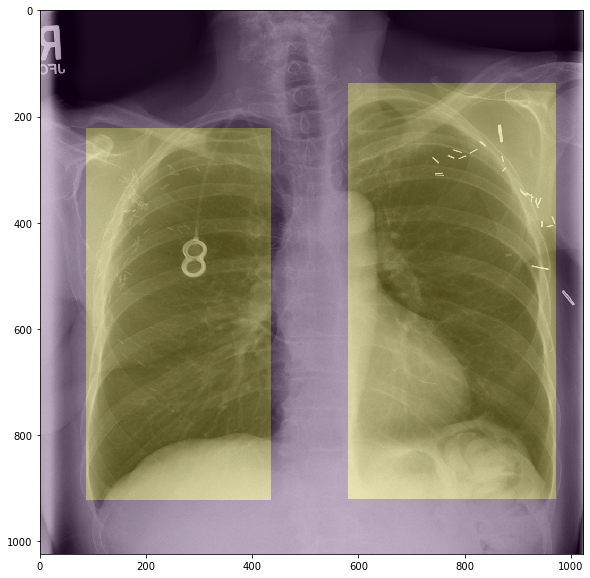

In [28]:
plt.figure(figsize=(10,10))
plt.imshow(image, cmap="gray")
plt.imshow(lungs_finder_segmentator(image, False), alpha=0.25)
plt.show

In [40]:
def plot_show(img):
    plt.figure(figsize=(10, 10))
    plt.imshow(img, cmap='gray')
    plt.show()
    
def plot_masks(arrays, names):
    expert = arrays[-1]
    arrays = arrays[:-1]
    names = names[:-1]
    nrows = 1
    ncols = len(arrays)
    fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*5, nrows*4))
    for i, (mask, name) in enumerate(zip(arrays, names)):
        fig.add_subplot(nrows, ncols, i+1)
        plt.imshow(arrays[0], cmap="gray")
        if name != "image":
            plt.imshow(mask, alpha=0.25)
            plt.imshow(expert, alpha=0.50)
            ax[i].set_title(f"{name}", fontsize=23)  # set title
        else:
            ax[i].set_title(name, fontsize=23)
    plt.show()

In [36]:
data_dir =  osp.join("..", "data", "Dataset")
df = pd.read_csv(osp.join(data_dir, "OpenPart.csv"))

In [37]:
orig_data = glob.glob(osp.join(data_dir, "Origin", "*"))
expert_masks = glob.glob(osp.join(data_dir, "Expert", "*"))
masks_nn_1 = glob.glob(osp.join(data_dir, "sample_1", "*"))
masks_nn_2 = glob.glob(osp.join(data_dir, "sample_2", "*"))
masks_nn_3 = glob.glob(osp.join(data_dir, "sample_3", "*"))
assert len(orig_data) == len(expert_masks) == len(masks_nn_1) == len(masks_nn_2) == len(masks_nn_3)

../data/Dataset/Origin/00018366_000.png


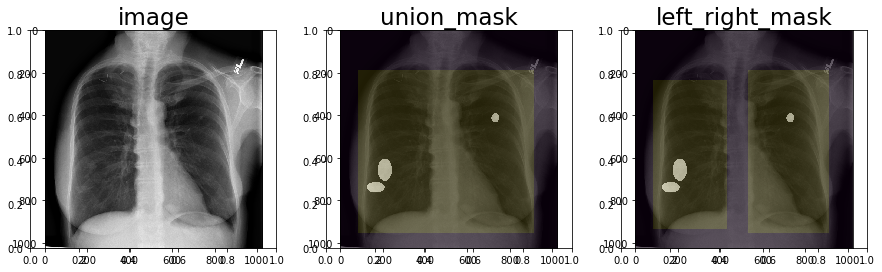

../data/Dataset/Origin/00012414_000.png


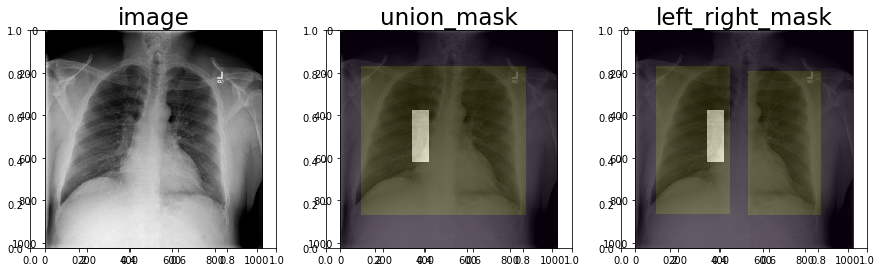

../data/Dataset/Origin/00011237_006.png


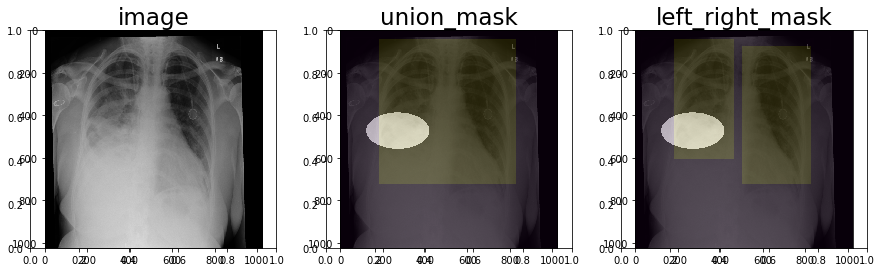

../data/Dataset/Origin/00012829_004.png


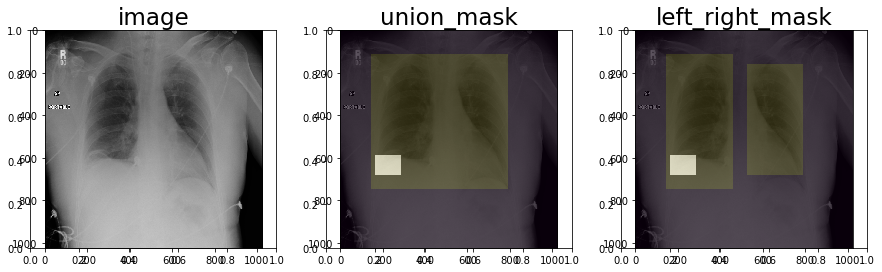

../data/Dataset/Origin/00011502_001.png


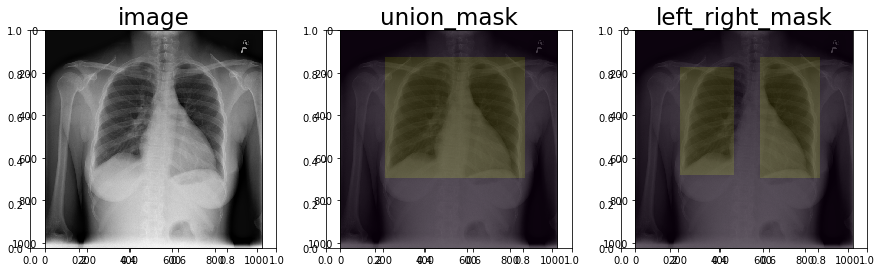

../data/Dataset/Origin/00018980_002.png


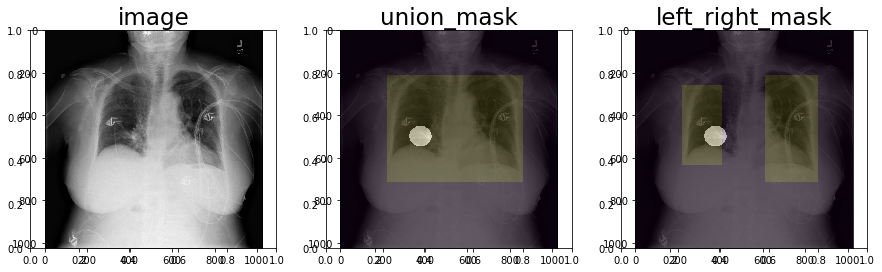

../data/Dataset/Origin/00010815_006.png


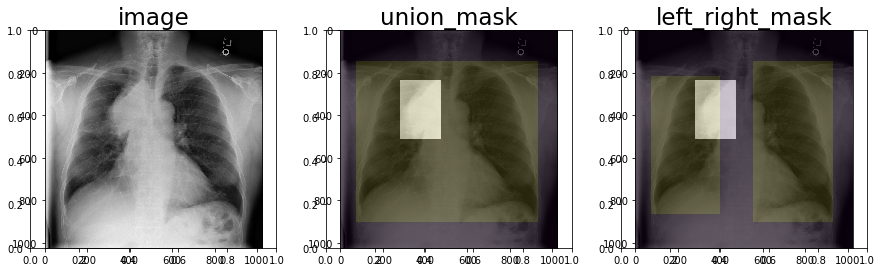

../data/Dataset/Origin/00011925_072.png


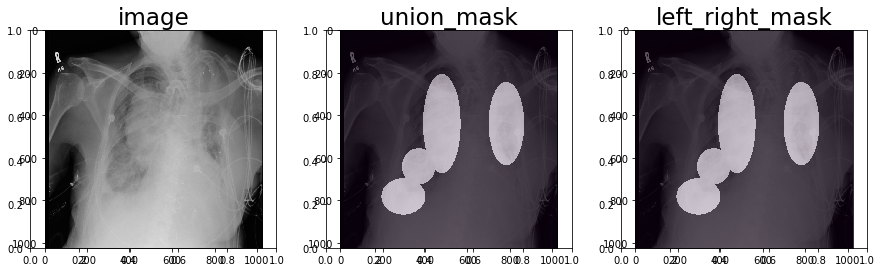

../data/Dataset/Origin/00002597_000.png


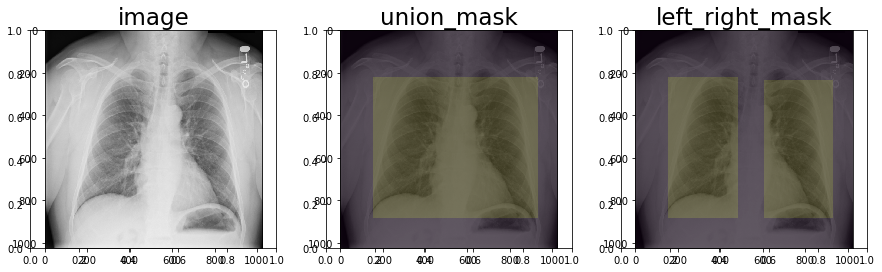

../data/Dataset/Origin/00000150_002.png


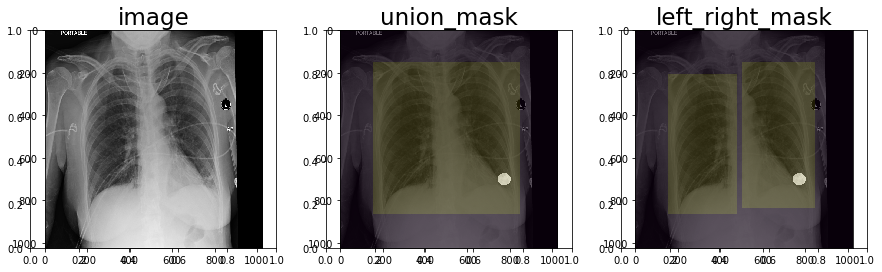

../data/Dataset/Origin/00017214_015.png


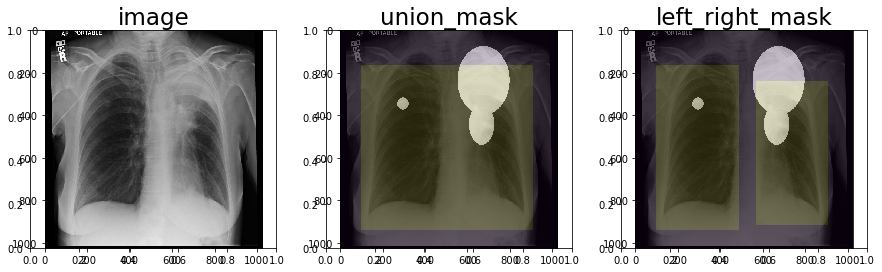

../data/Dataset/Origin/00000181_061.png


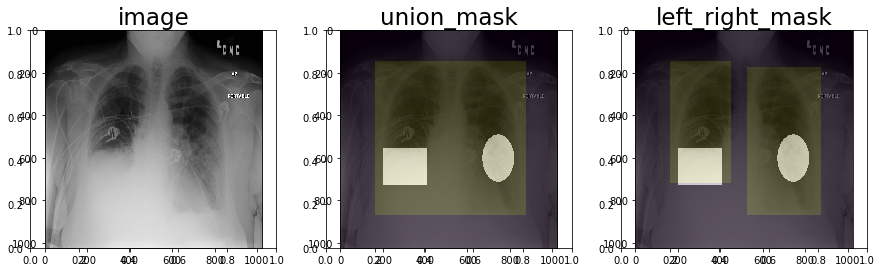

../data/Dataset/Origin/00006948_002.png


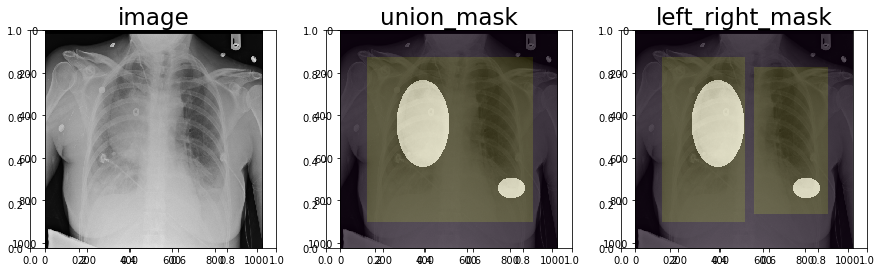

../data/Dataset/Origin/00008547_001.png


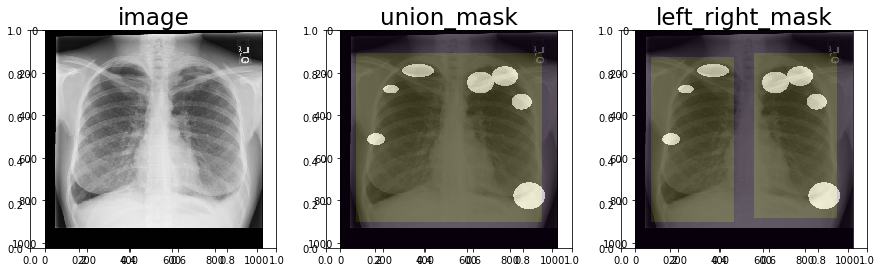

../data/Dataset/Origin/00005089_014.png


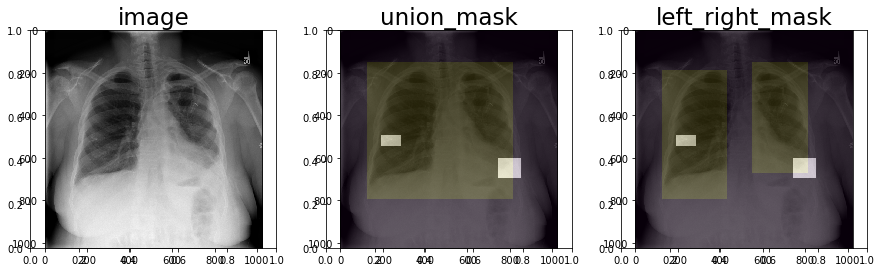

../data/Dataset/Origin/00009619_000.png


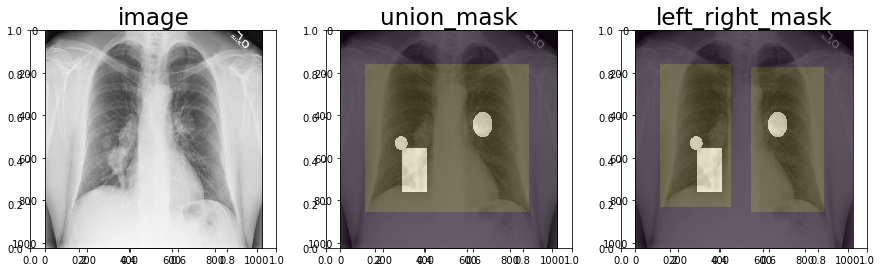

../data/Dataset/Origin/00003391_001.png


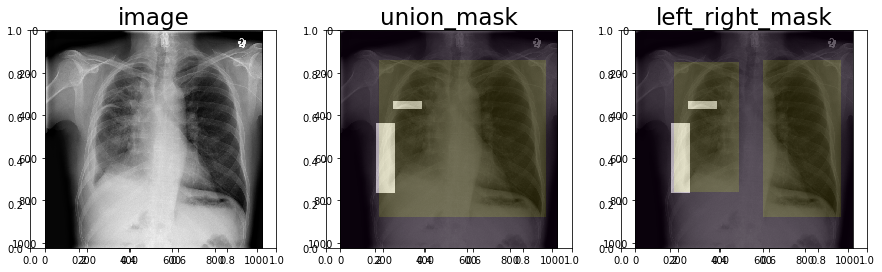

../data/Dataset/Origin/00017137_016.png


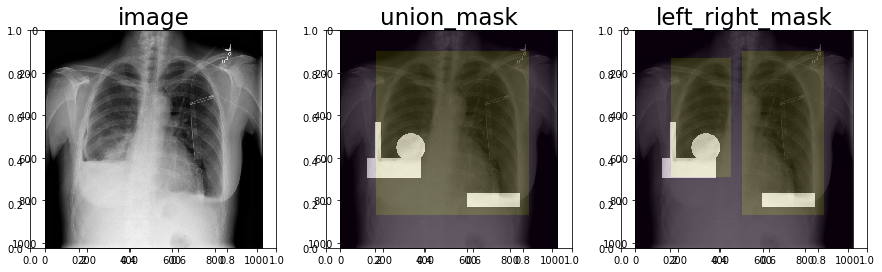

../data/Dataset/Origin/00019767_016.png


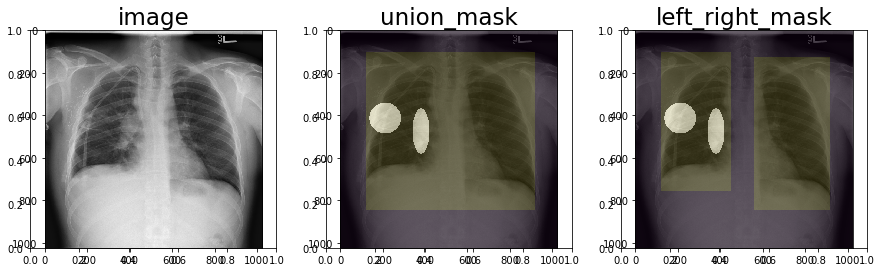

../data/Dataset/Origin/00019124_090.png


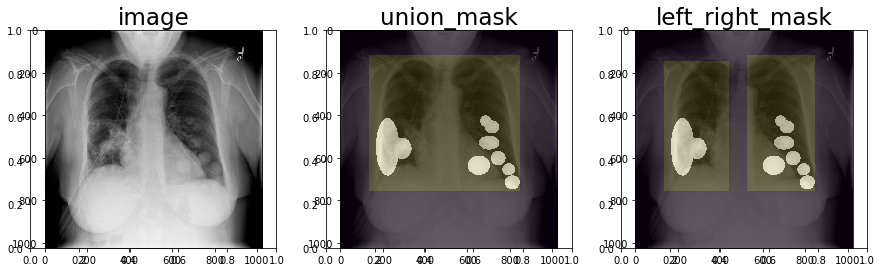

../data/Dataset/Origin/00013337_000.png


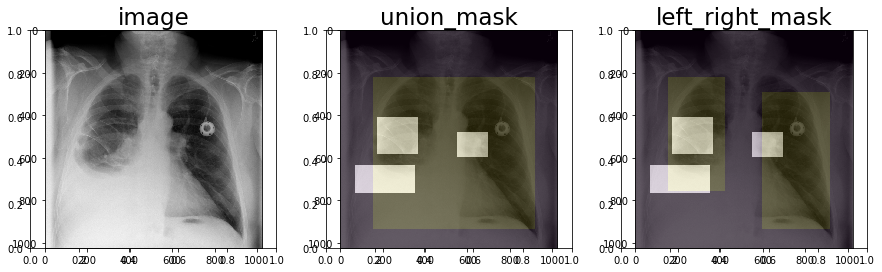

../data/Dataset/Origin/00002706_004.png


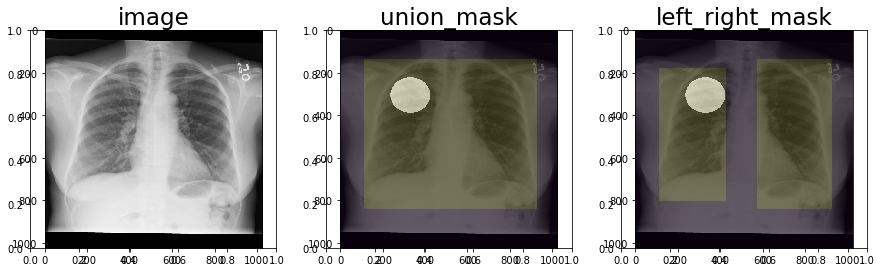

../data/Dataset/Origin/00010103_014.png


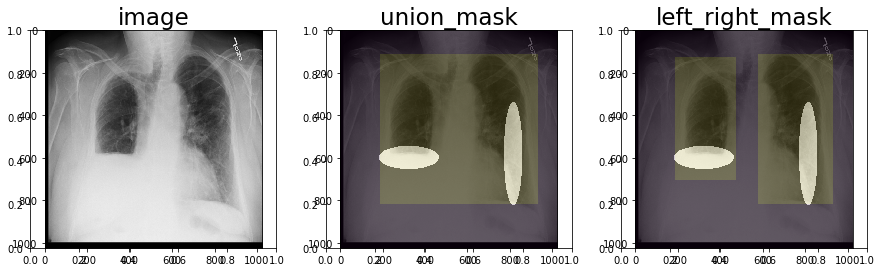

../data/Dataset/Origin/00003787_003.png


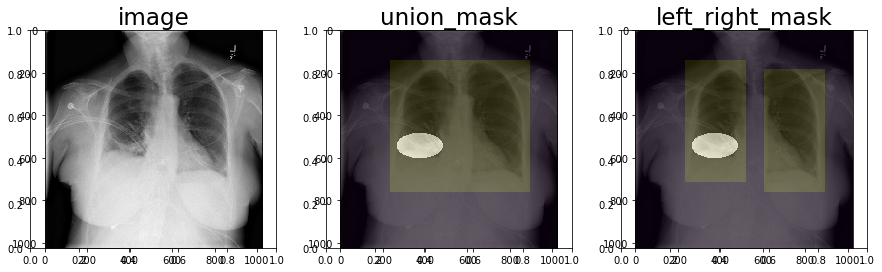

../data/Dataset/Origin/00018063_000.png


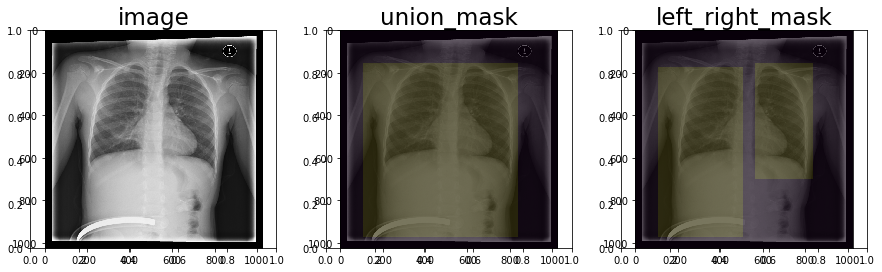

../data/Dataset/Origin/00003973_008.png


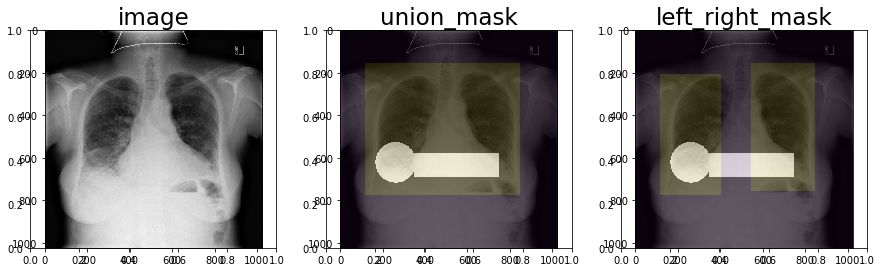

../data/Dataset/Origin/00010447_018.png


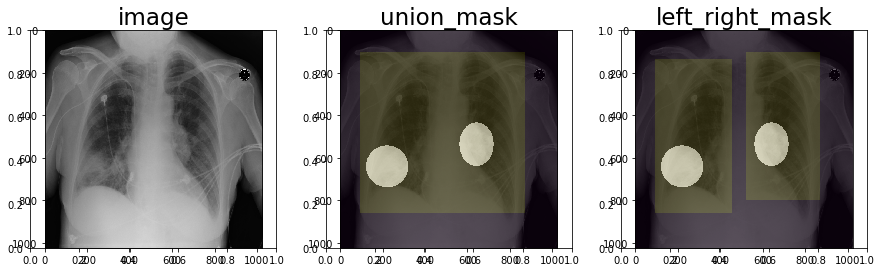

../data/Dataset/Origin/00003333_002.png


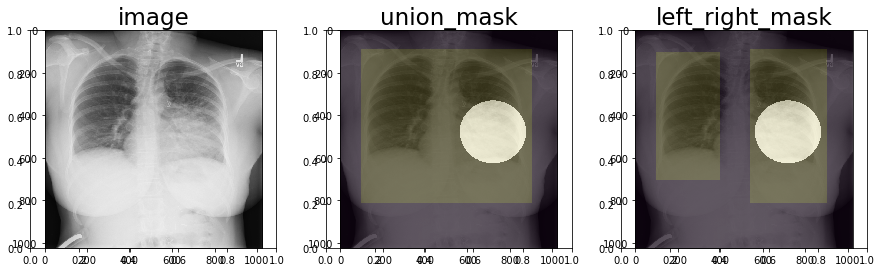

../data/Dataset/Origin/00011827_003.png


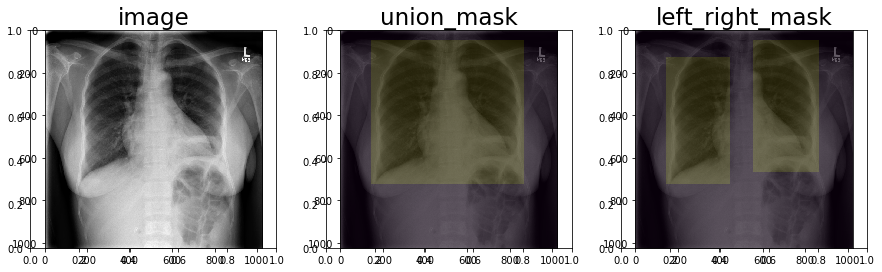

../data/Dataset/Origin/00013751_003.png


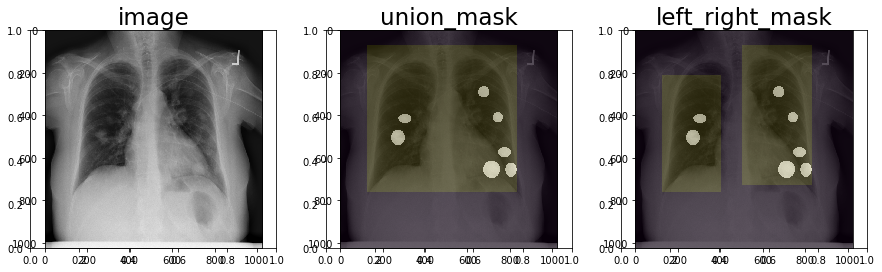

../data/Dataset/Origin/00011355_011.png


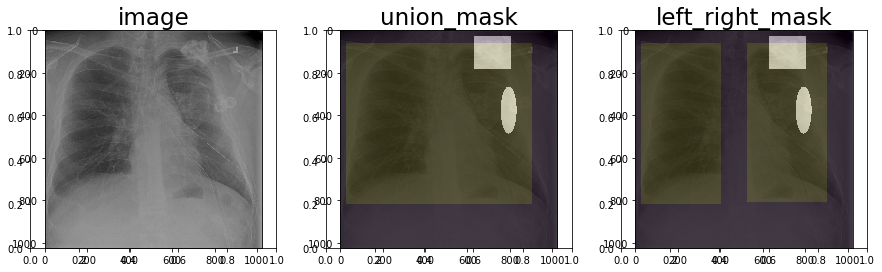

../data/Dataset/Origin/00010277_000.png


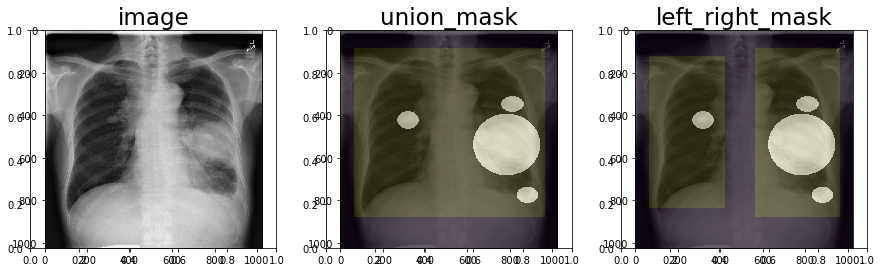

../data/Dataset/Origin/00001075_024.png


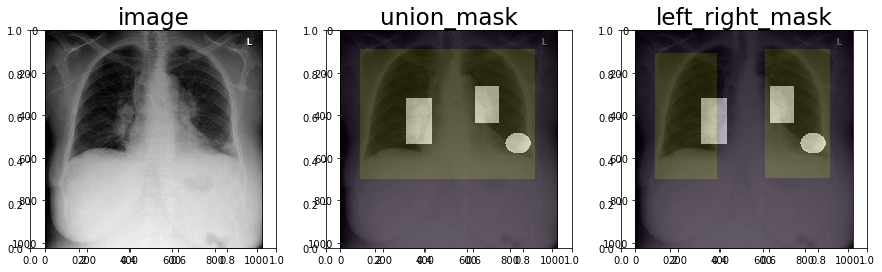

../data/Dataset/Origin/00000808_002.png


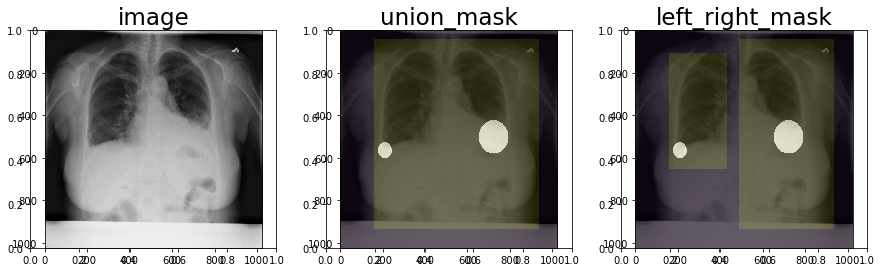

../data/Dataset/Origin/00009507_004.png


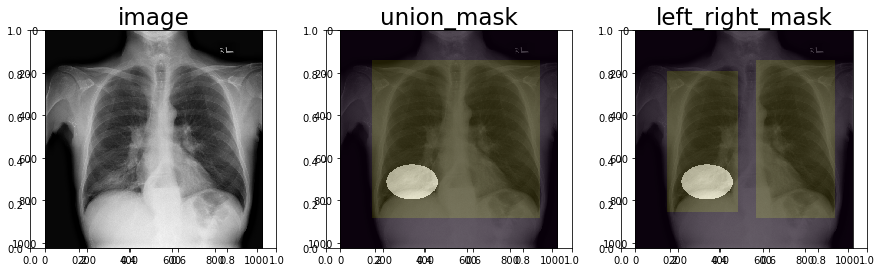

../data/Dataset/Origin/00014015_003.png


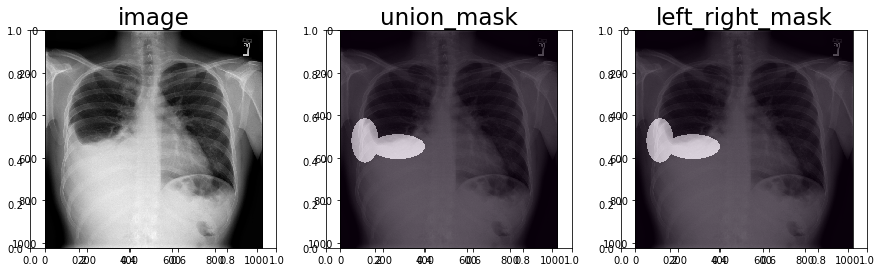

../data/Dataset/Origin/00000344_003.png


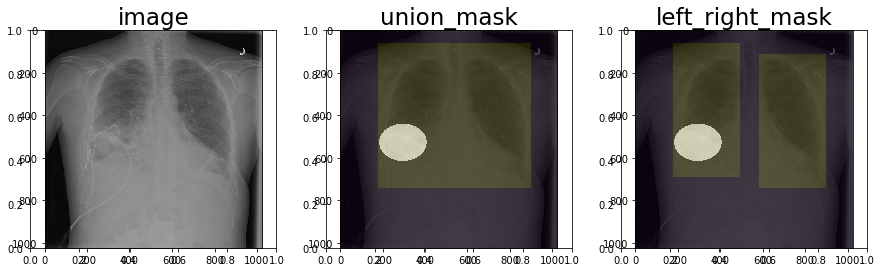

../data/Dataset/Origin/00020000_000.png


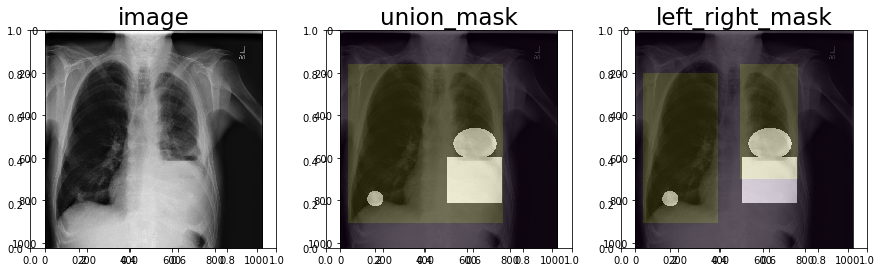

../data/Dataset/Origin/00009437_008.png


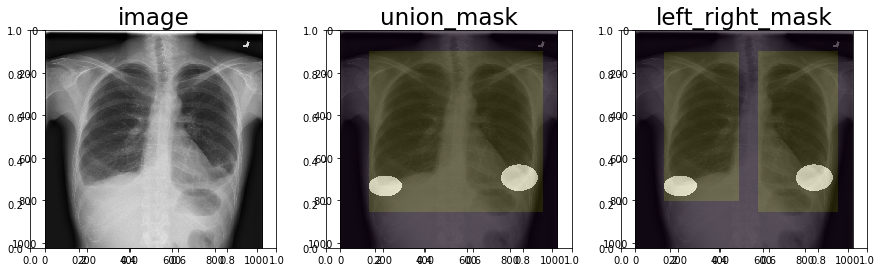

../data/Dataset/Origin/00012892_010.png


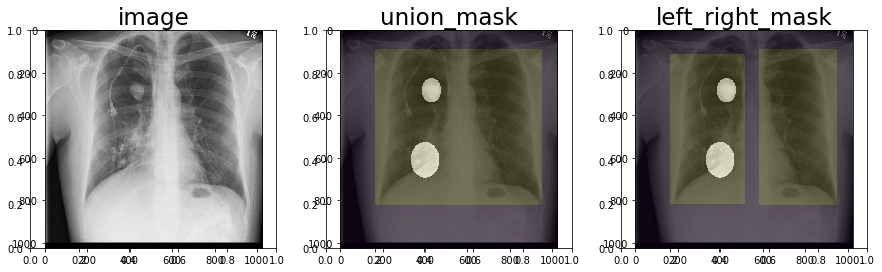

../data/Dataset/Origin/00014447_004.png


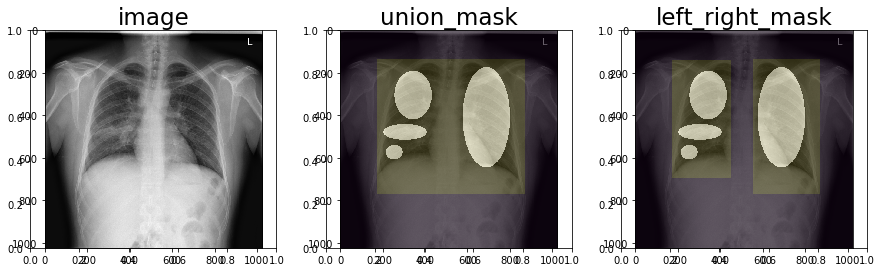

../data/Dataset/Origin/00001187_006.png


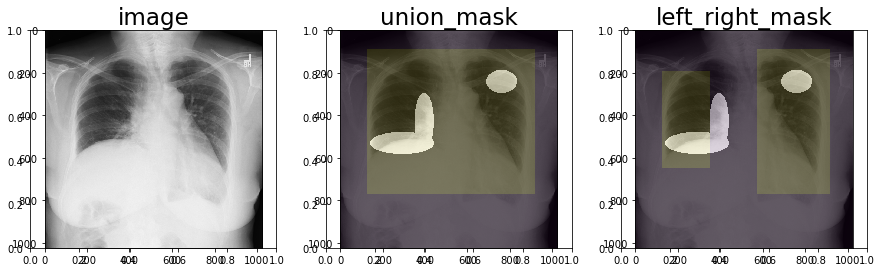

../data/Dataset/Origin/00019495_004.png


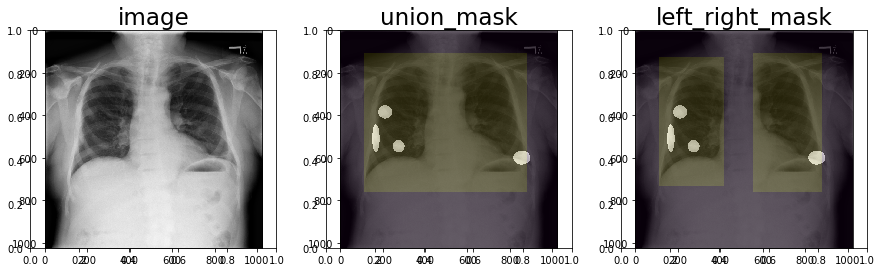

../data/Dataset/Origin/00004808_090.png


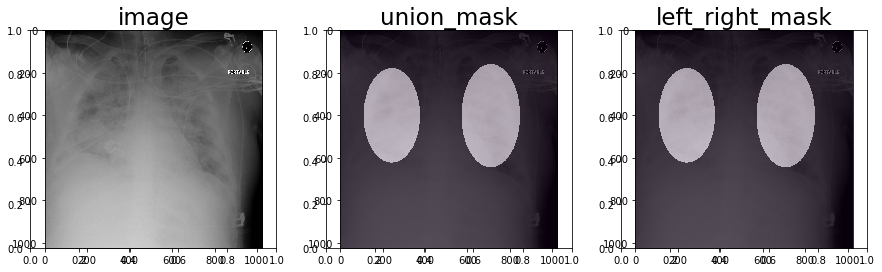

../data/Dataset/Origin/00017243_010.png


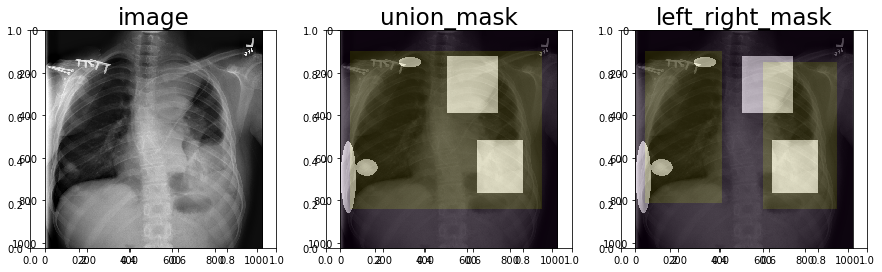

../data/Dataset/Origin/00020124_003.png


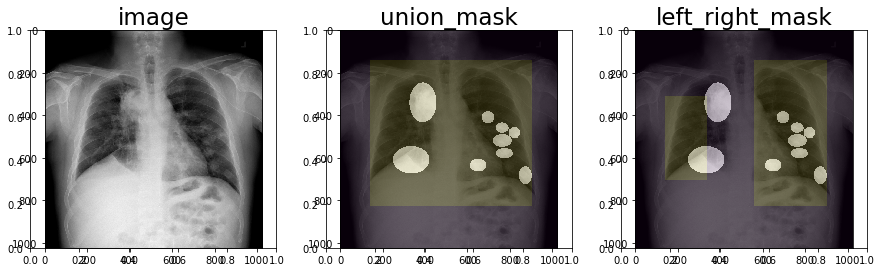

../data/Dataset/Origin/00002578_000.png


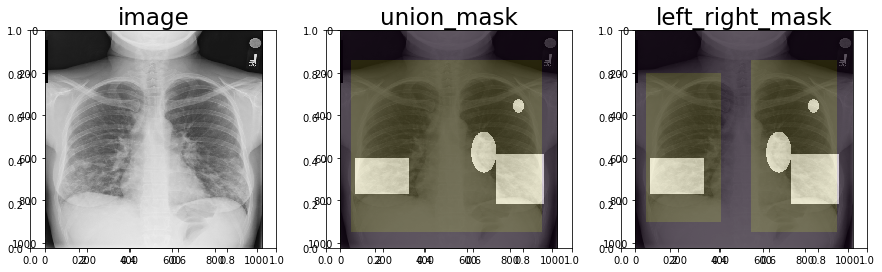

../data/Dataset/Origin/00003072_028.png


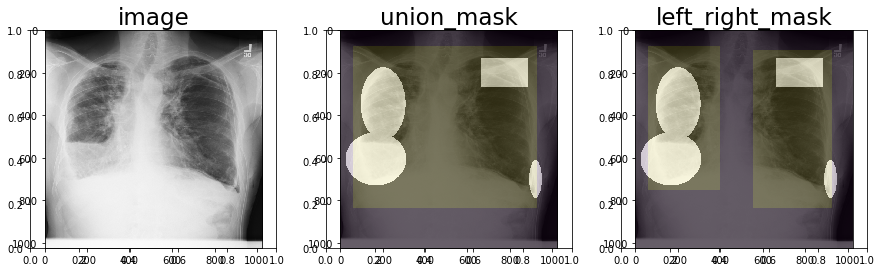

../data/Dataset/Origin/00002763_031.png


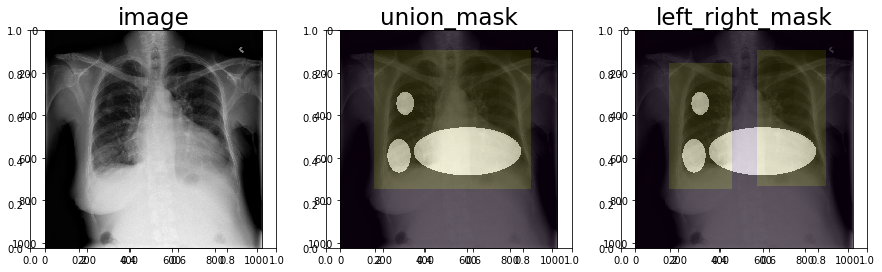

../data/Dataset/Origin/00004911_018.png


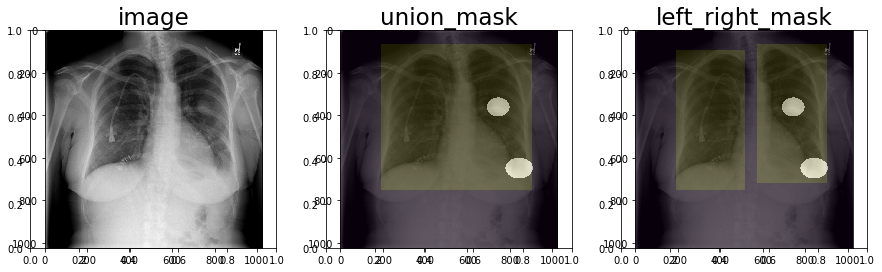

../data/Dataset/Origin/00010381_000.png


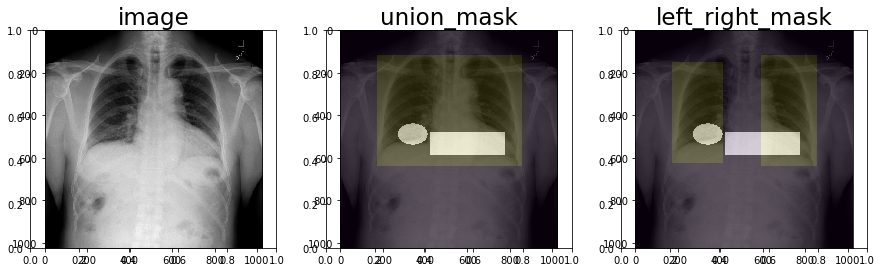

../data/Dataset/Origin/00008008_027.png


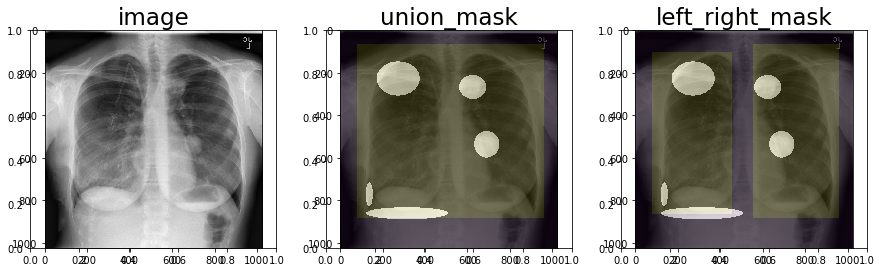

../data/Dataset/Origin/00008386_000.png


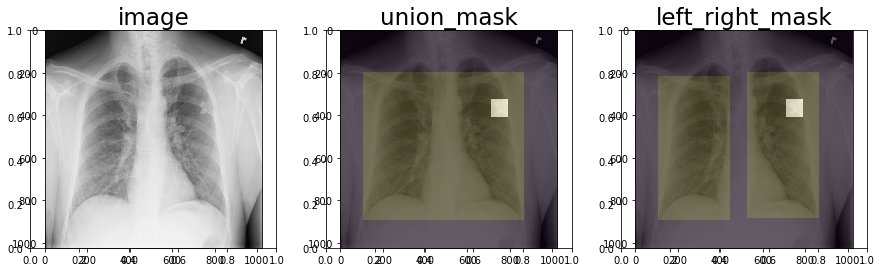

../data/Dataset/Origin/00010060_038.png


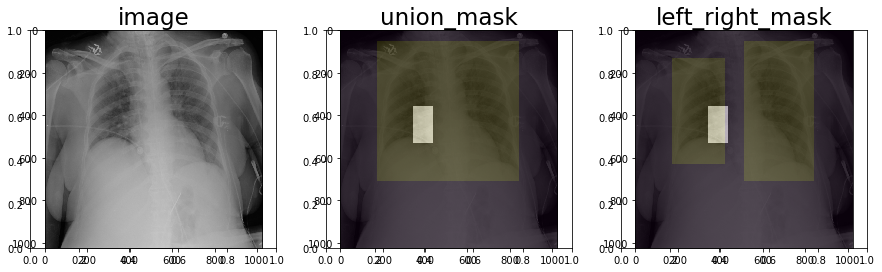

../data/Dataset/Origin/00012592_005.png


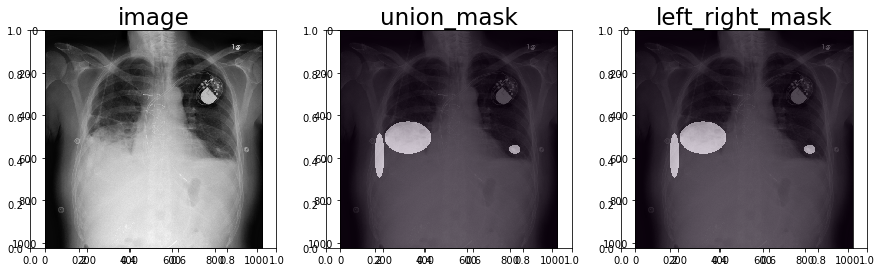

../data/Dataset/Origin/00007034_016.png


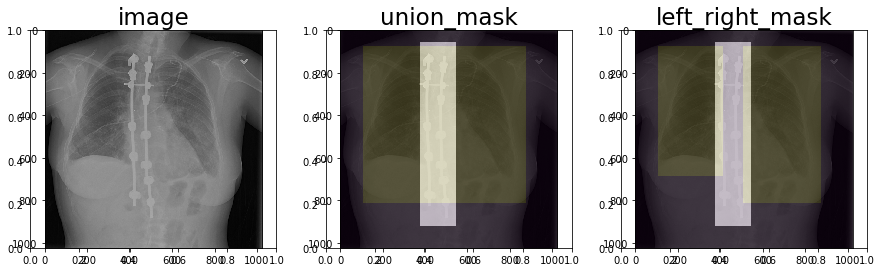

../data/Dataset/Origin/00011157_001.png


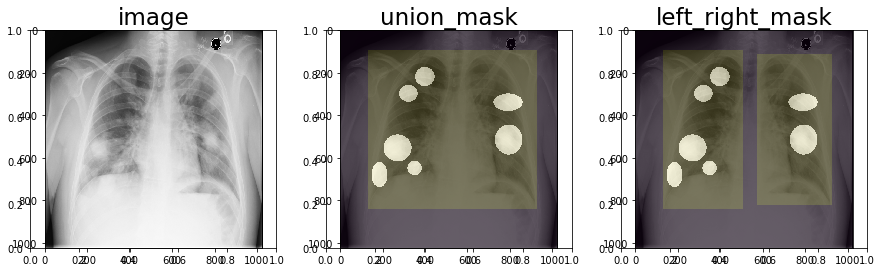

../data/Dataset/Origin/00008554_009.png


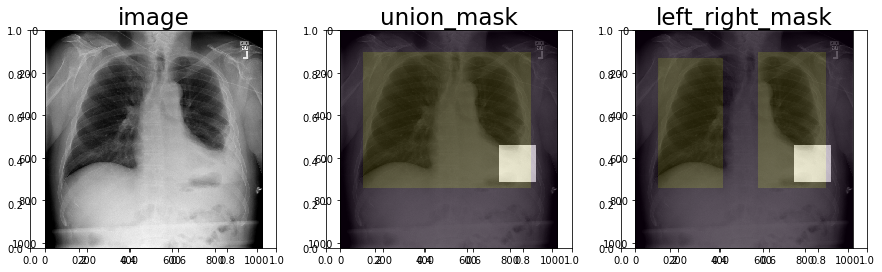

../data/Dataset/Origin/00012174_000.png


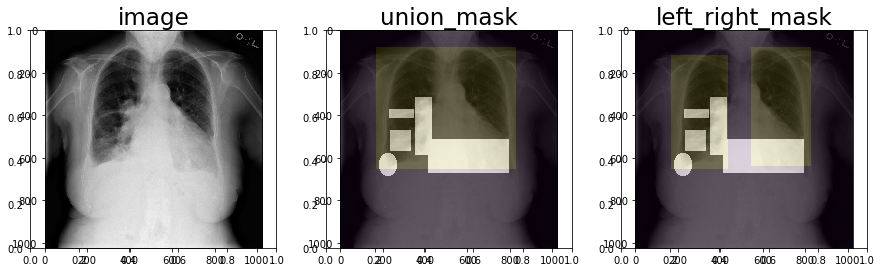

../data/Dataset/Origin/00011269_019.png


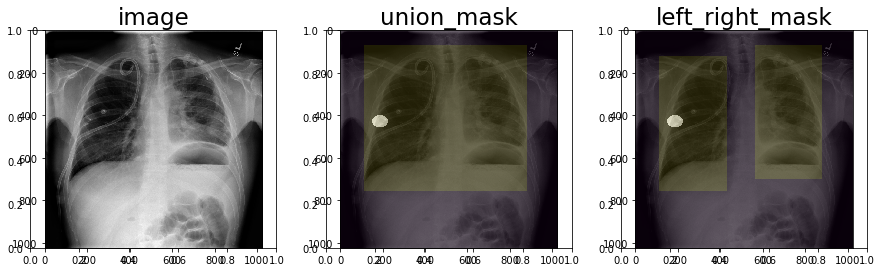

../data/Dataset/Origin/00015792_005.png


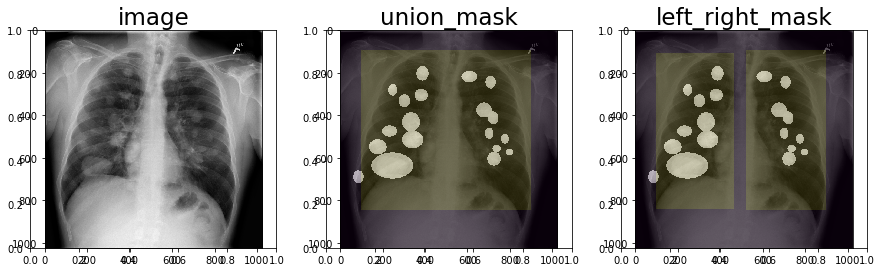

../data/Dataset/Origin/00002711_000.png


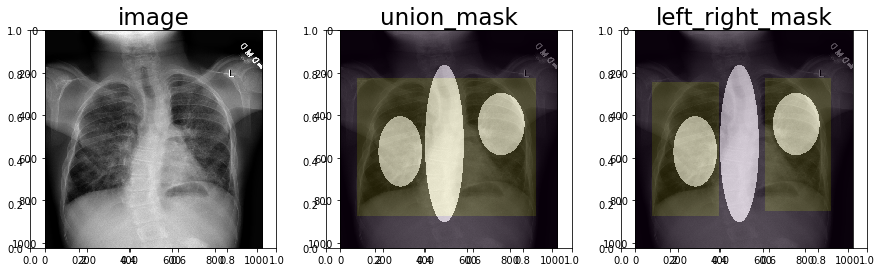

../data/Dataset/Origin/00016267_000.png


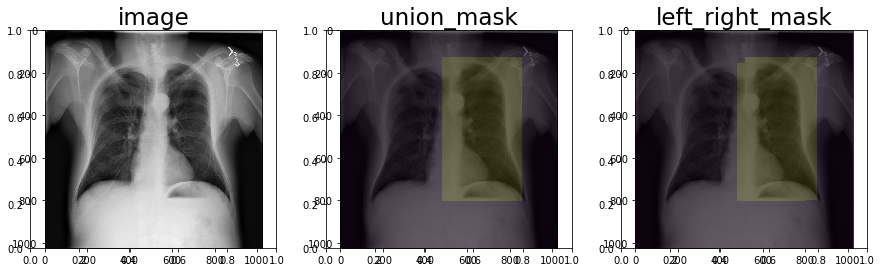

../data/Dataset/Origin/00013911_021.png


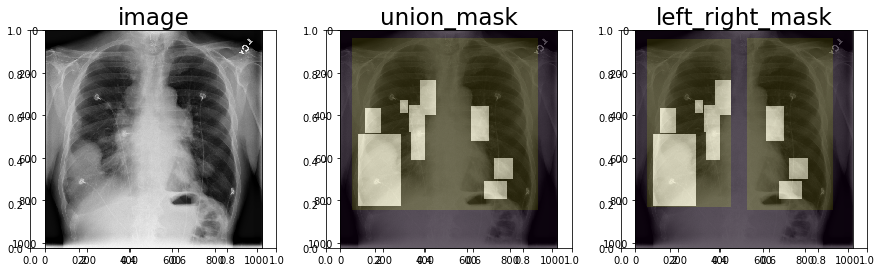

../data/Dataset/Origin/00010936_016.png


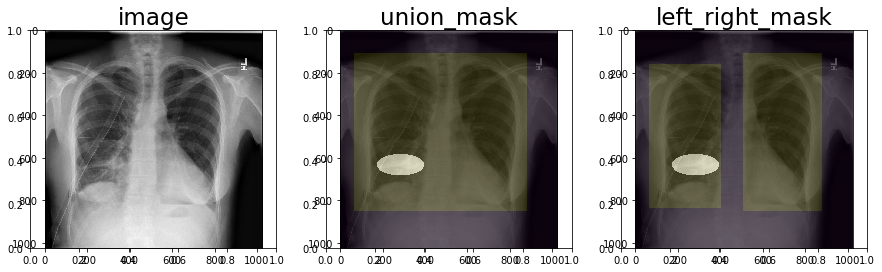

../data/Dataset/Origin/00013951_001.png


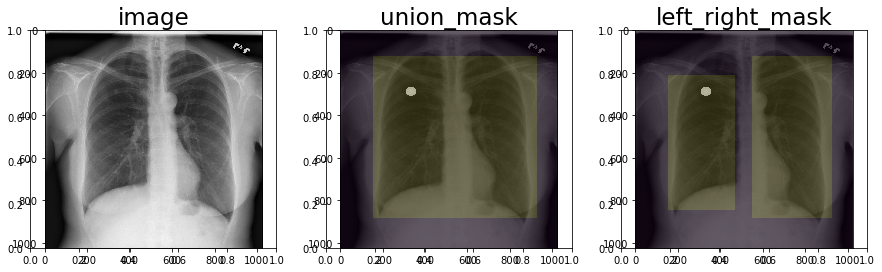

../data/Dataset/Origin/00012094_040.png


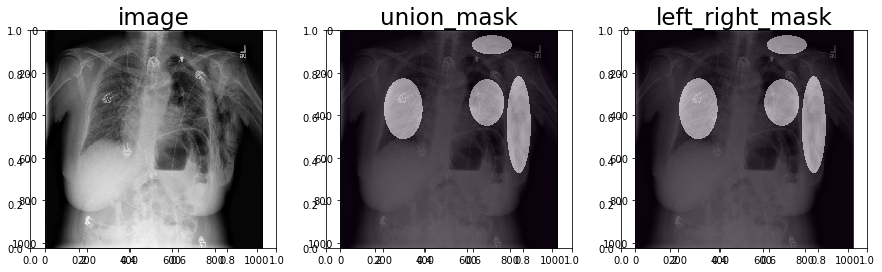

../data/Dataset/Origin/00002856_009.png


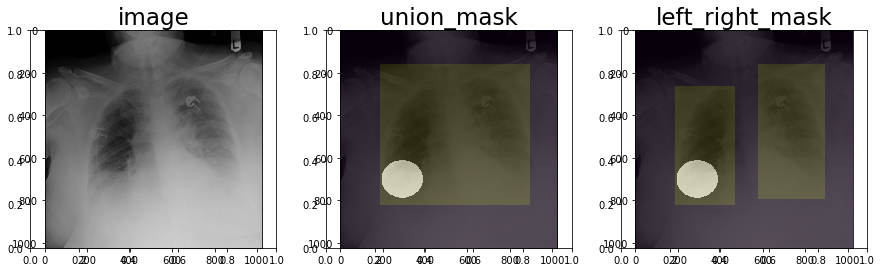

../data/Dataset/Origin/00000974_002.png


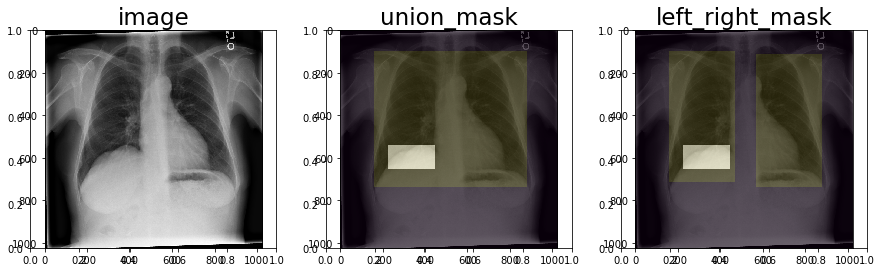

../data/Dataset/Origin/00014280_000.png


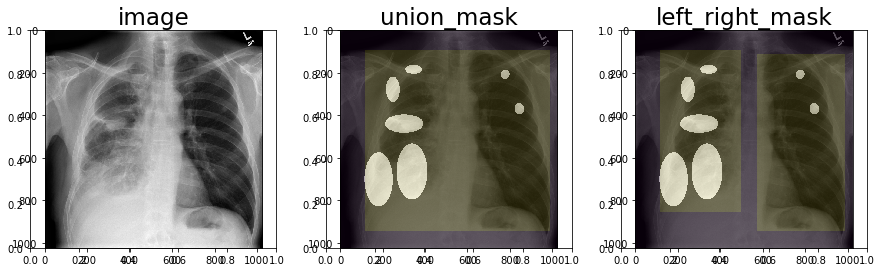

../data/Dataset/Origin/00016589_005.png


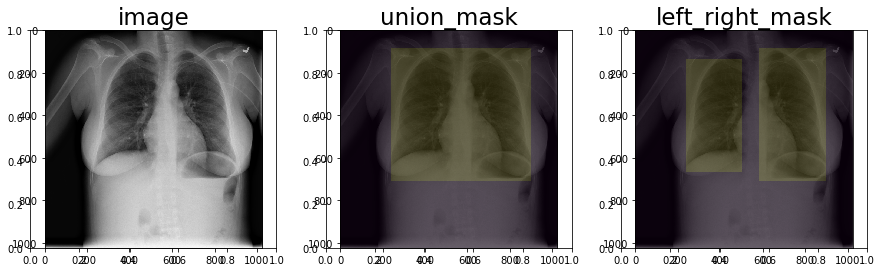

../data/Dataset/Origin/00000468_033.png


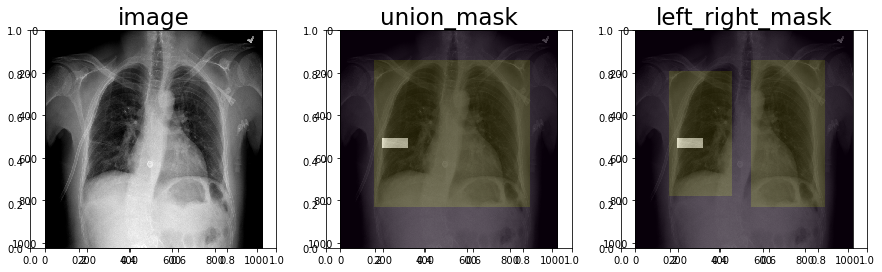

../data/Dataset/Origin/00000072_000.png


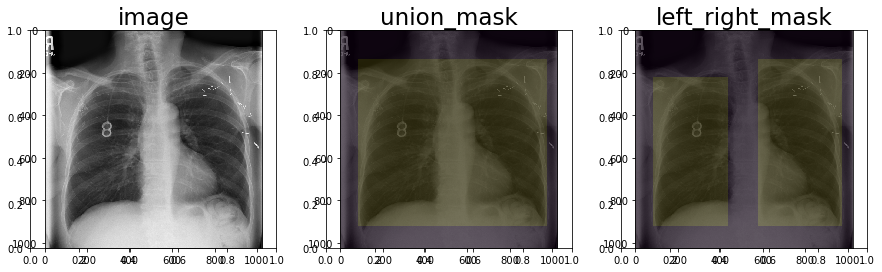

../data/Dataset/Origin/00006323_009.png


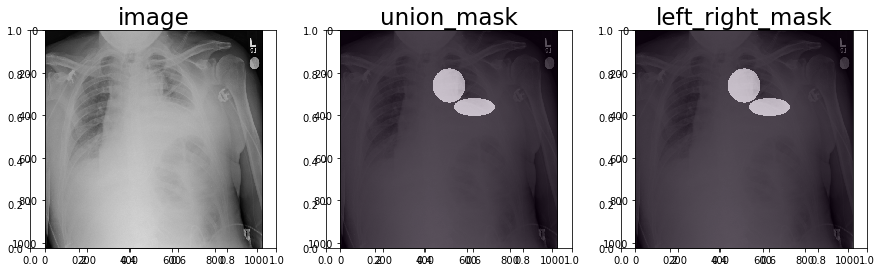

../data/Dataset/Origin/00012270_005.png


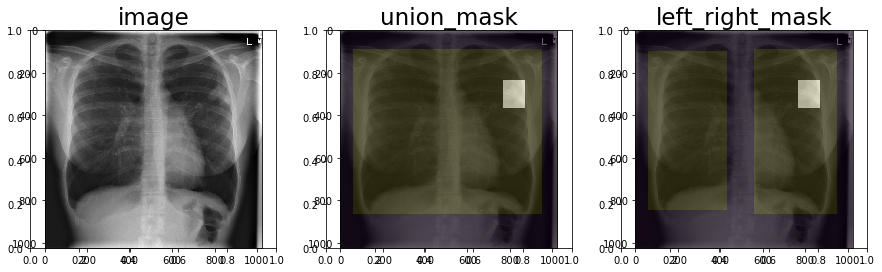

../data/Dataset/Origin/00013977_005.png


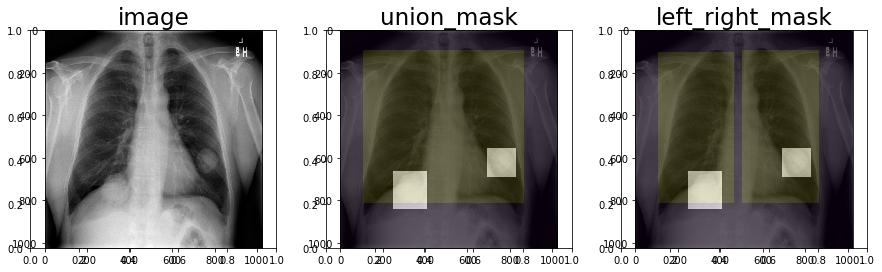

../data/Dataset/Origin/00000211_041.png


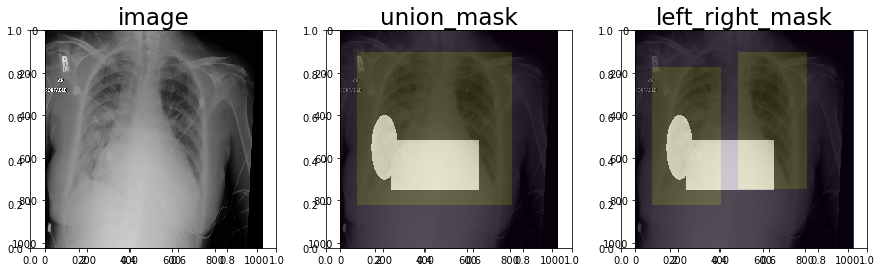

../data/Dataset/Origin/00009368_006.png


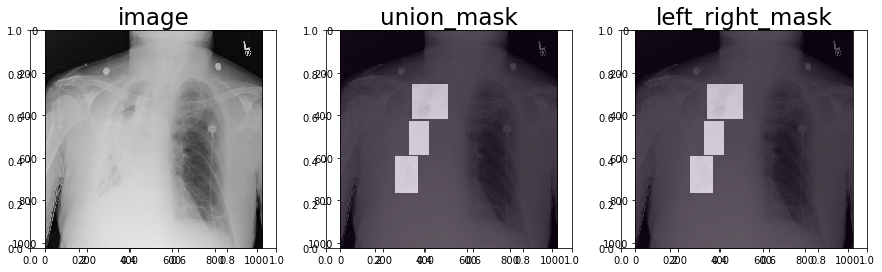

../data/Dataset/Origin/00016587_069.png


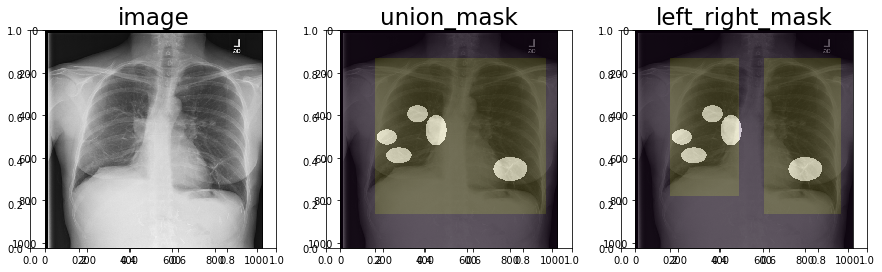

../data/Dataset/Origin/00008814_010.png


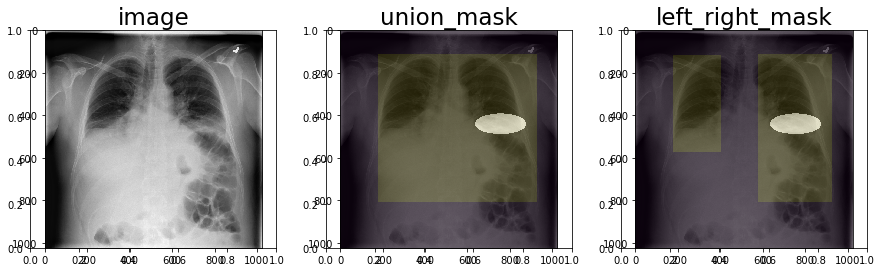

../data/Dataset/Origin/00013685_000.png


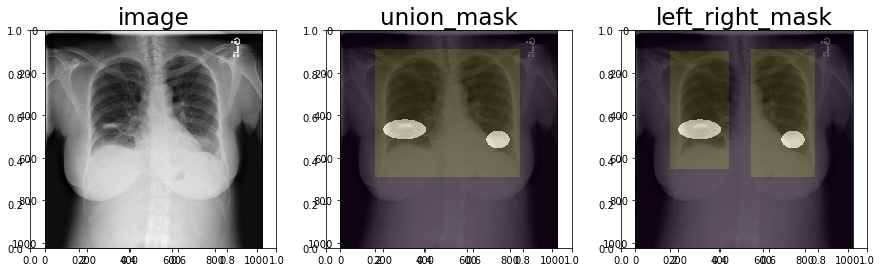

../data/Dataset/Origin/00012045_019.png


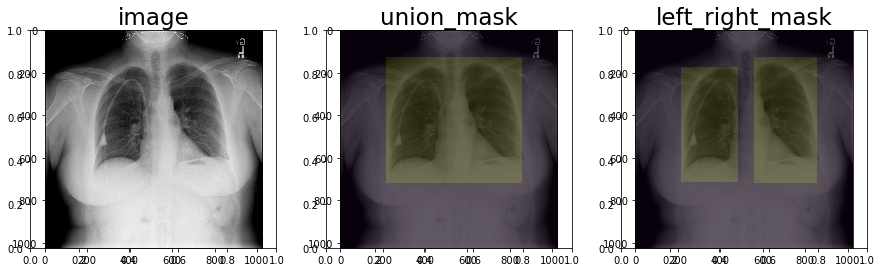

../data/Dataset/Origin/00002350_001.png


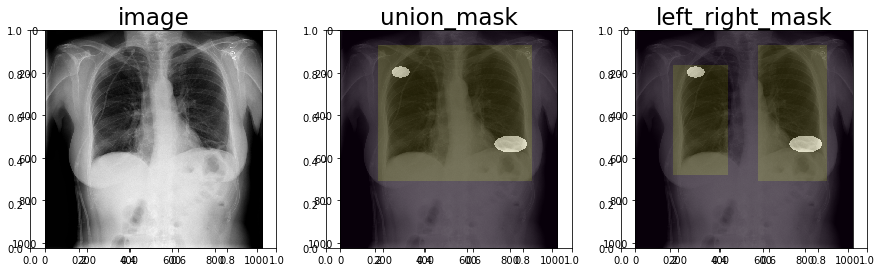

../data/Dataset/Origin/00002980_000.png


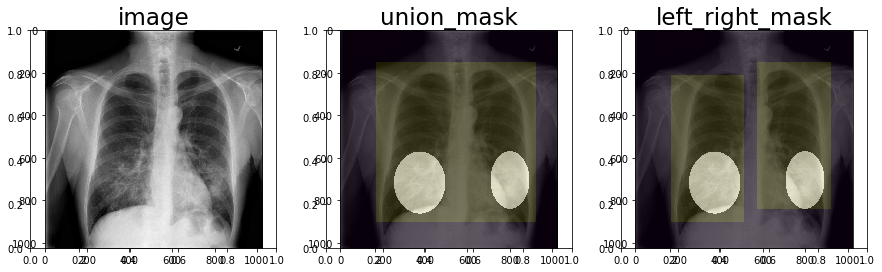

../data/Dataset/Origin/00002583_014.png


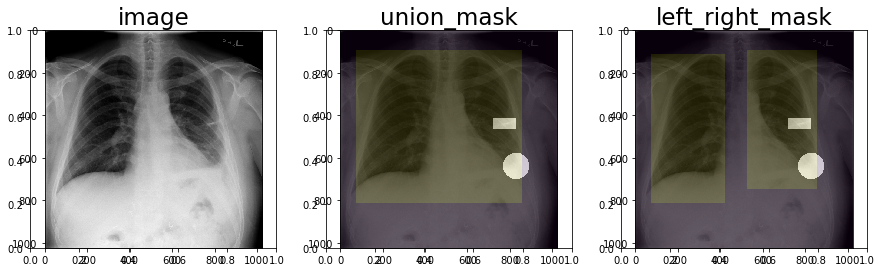

../data/Dataset/Origin/00003400_003.png


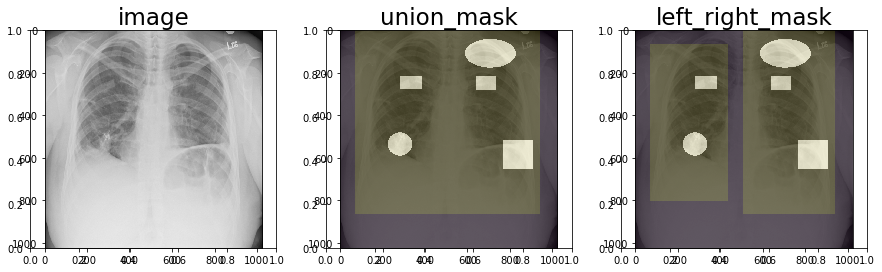

../data/Dataset/Origin/00017028_000.png


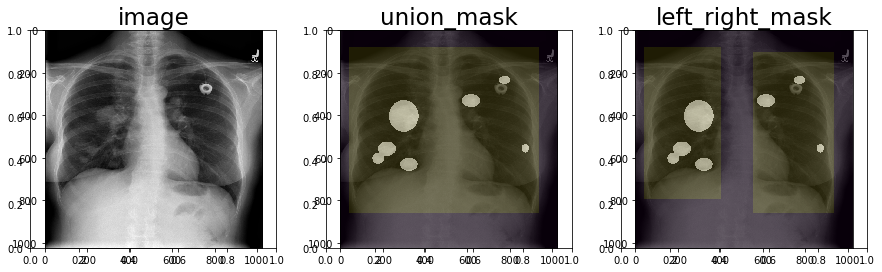

../data/Dataset/Origin/00014251_029.png


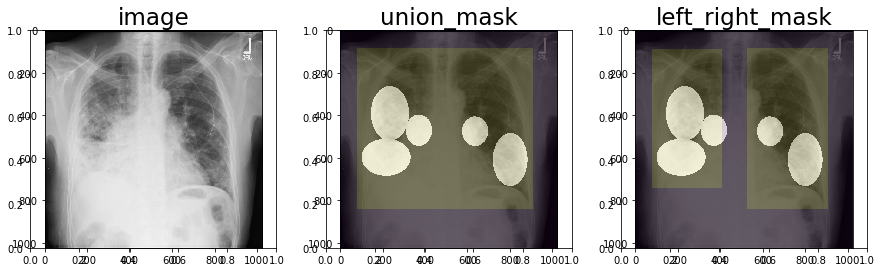

../data/Dataset/Origin/00007558_006.png


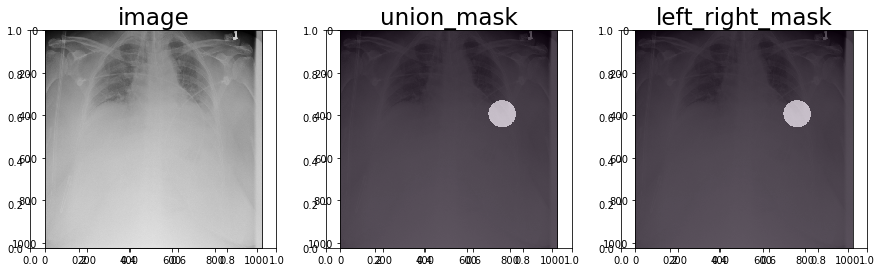

../data/Dataset/Origin/00000211_019.png


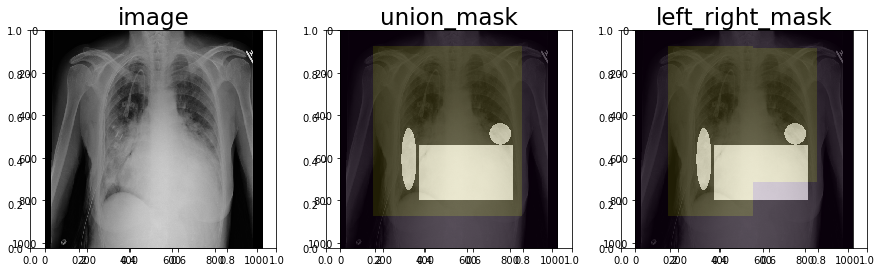

../data/Dataset/Origin/00005215_000.png


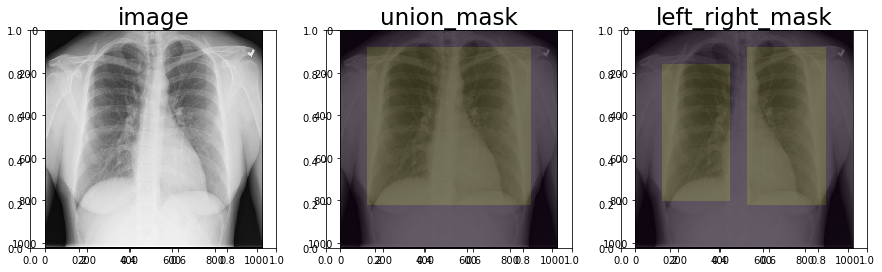

../data/Dataset/Origin/00013673_001.png


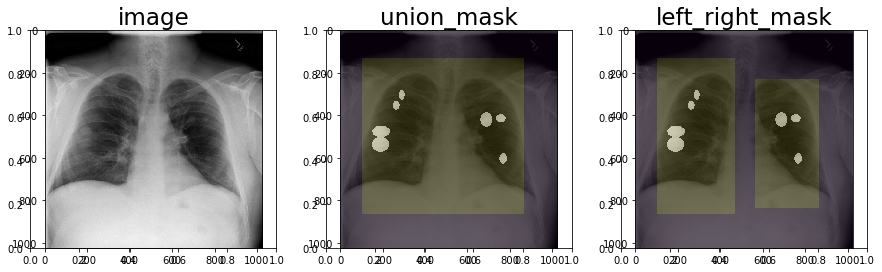

../data/Dataset/Origin/00003894_005.png


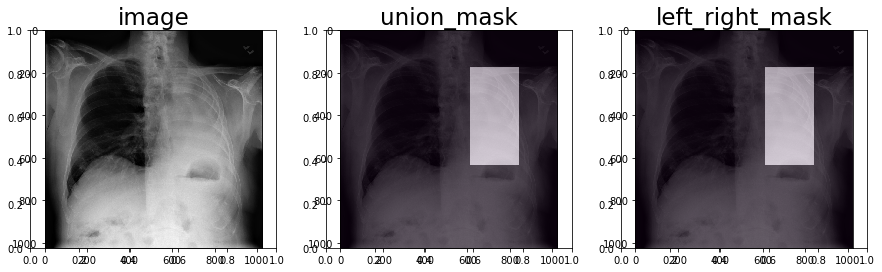

../data/Dataset/Origin/00007882_001.png


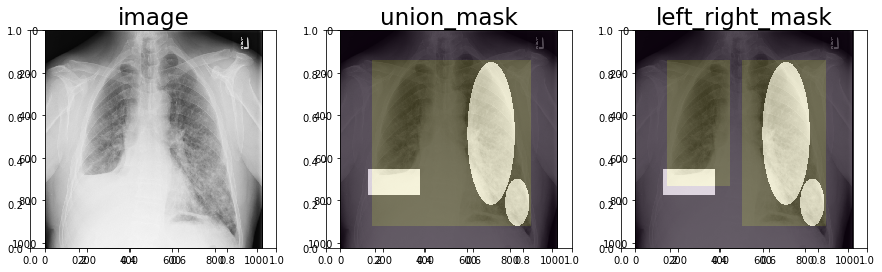

../data/Dataset/Origin/00000830_000.png


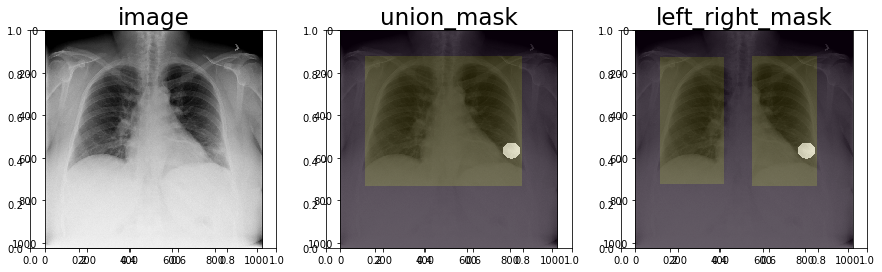

../data/Dataset/Origin/00005353_000.png


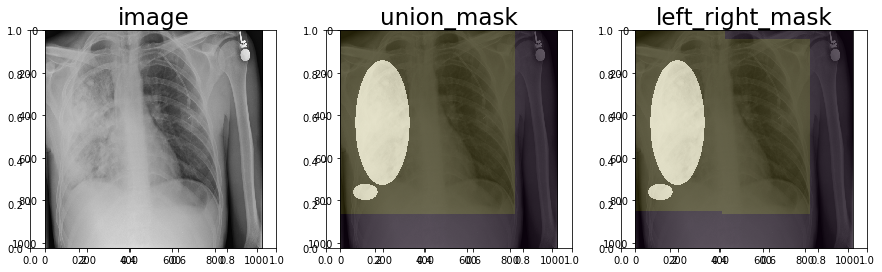

../data/Dataset/Origin/00013991_000.png


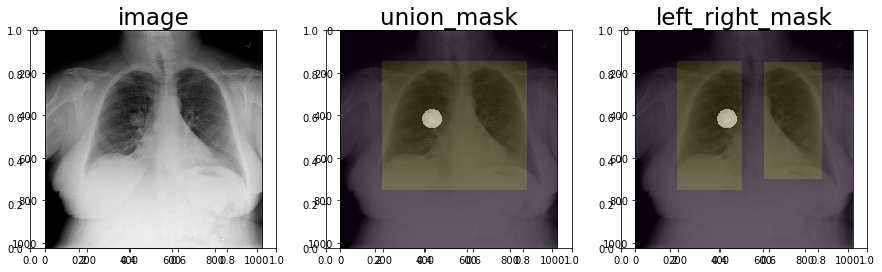

../data/Dataset/Origin/00019013_002.png


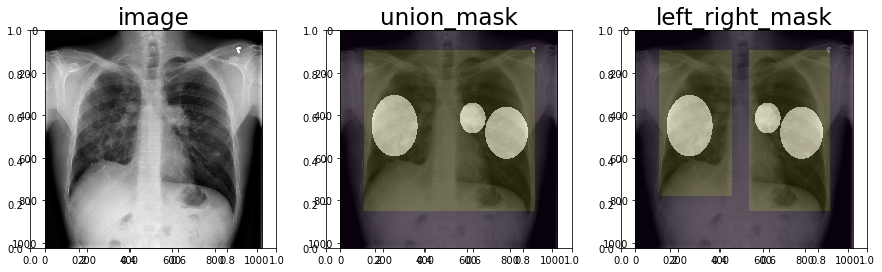

../data/Dataset/Origin/00016429_015.png


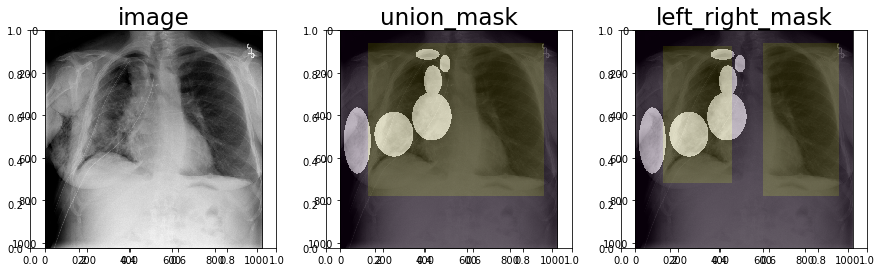

../data/Dataset/Origin/00011450_000.png


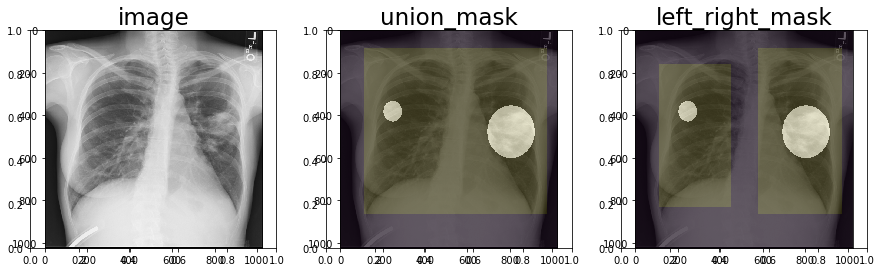

In [79]:
for file in orig_data:
    print(file)
    basename = osp.basename(file)
    filename = osp.splitext(basename)[0] 
    expert_mask_file = osp.join(data_dir, "Expert", f"{filename}_expert.png")
    nn_1_mask_file = osp.join(data_dir, "sample_1", f"{filename}_s1.png")
    nn_2_mask_file = osp.join(data_dir, "sample_2", f"{filename}_s2.png")
    nn_3_mask_file = osp.join(data_dir, "sample_3", f"{filename}_s3.png")
    
    image = cv2.imread(file)
    union_mask = lungs_finder_segmentator(image, True)
    left_right_mask = lungs_finder_segmentator(image, False)
    expert_mask = cv2.imread(expert_mask_file)
    
    assert image.shape == expert_mask.shape == nn_1_mask.shape == nn_2_mask.shape == nn_3_mask.shape
    
    arrays = [image, union_mask, left_right_mask, expert_mask]
    names = ["image","union_mask", "left_right_mask", "expert_mask"]

    plot_masks(arrays, names)

In [81]:
def plot_masks_1(arrays, names):
    expert = arrays[-1]
    arrays = arrays[:-1]
    names = names[:-1]
    nrows = 1
    ncols = len(arrays)
    fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*5, nrows*4))
    for i, (mask, name) in enumerate(zip(arrays, names)):
        fig.add_subplot(nrows, ncols, i+1)
        plt.imshow(arrays[0], cmap="gray")
        if name != "image":
            plt.imshow(mask, alpha=0.25)
            ax[i].set_title(f"{name}", fontsize=23)  # set title
        else:
            ax[i].set_title(name, fontsize=23)
    plt.show()

../data/Dataset/Origin/00012414_000.png


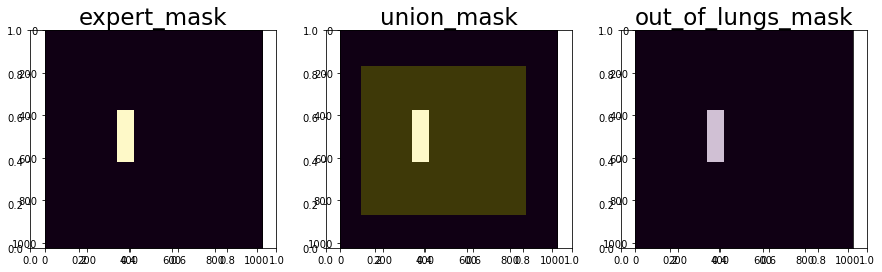

../data/Dataset/Origin/00011237_006.png


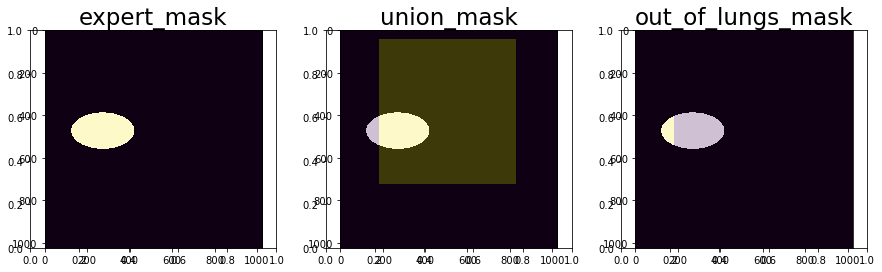

In [112]:
for file in orig_data[1:3]:
    print(file)
    basename = osp.basename(file)
    filename = osp.splitext(basename)[0] 
    expert_mask_file = osp.join(data_dir, "Expert", f"{filename}_expert.png")
    nn_1_mask_file = osp.join(data_dir, "sample_1", f"{filename}_s1.png")
    nn_2_mask_file = osp.join(data_dir, "sample_2", f"{filename}_s2.png")
    nn_3_mask_file = osp.join(data_dir, "sample_3", f"{filename}_s3.png")
    
    image = cv2.imread(file)
    union_mask = lungs_finder_segmentator(image, True)
    left_right_mask = lungs_finder_segmentator(image, False)
    expert_mask = cv2.imread(expert_mask_file,0)
    
    arrays = [expert_mask, union_mask, np.bitwise_and(np.bitwise_xor(union_mask, expert_mask), expert_mask), expert_mask]
    names = ["expert_mask","union_mask", "out_of_lungs_mask", "expert_mask"]

    plot_masks_1(arrays, names)

In [103]:
def area_out_of_lungs(lungs, predict):
    diff_mask = np.bitwise_xor(lungs, predict)
    out_of_lungs_mask = np.bitwise_and(diff_mask, predict)
    
    area_predict = int(predict.sum() / 255.0)  # in pixels
    area_out_of_lungs_mask = int(out_of_lungs_mask.sum() / 255.0)  # in pixels
    
    return area_out_of_lungs_mask / area_predict

In [111]:
area_out_of_lungs(lungs_finder_segmentator(plt.imread("../data/Dataset/Origin/00011237_006.png", 0)), plt.imread("../data/Dataset/Expert/00011237_006_expert.png", 0))

0.1441262830325997